# Global Child Mortality Rate

### Database : UNICEF

#### ©drateendrajha.com

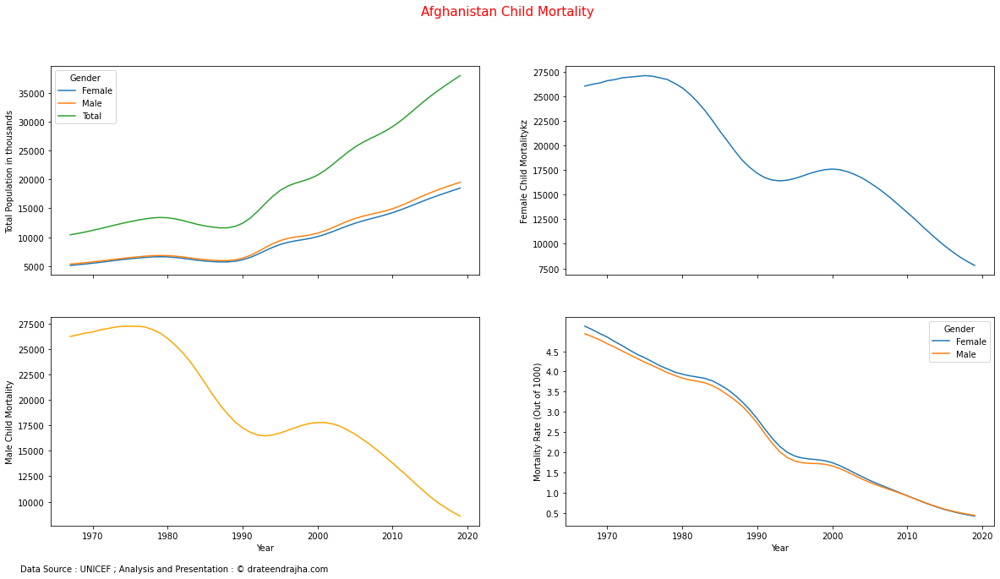

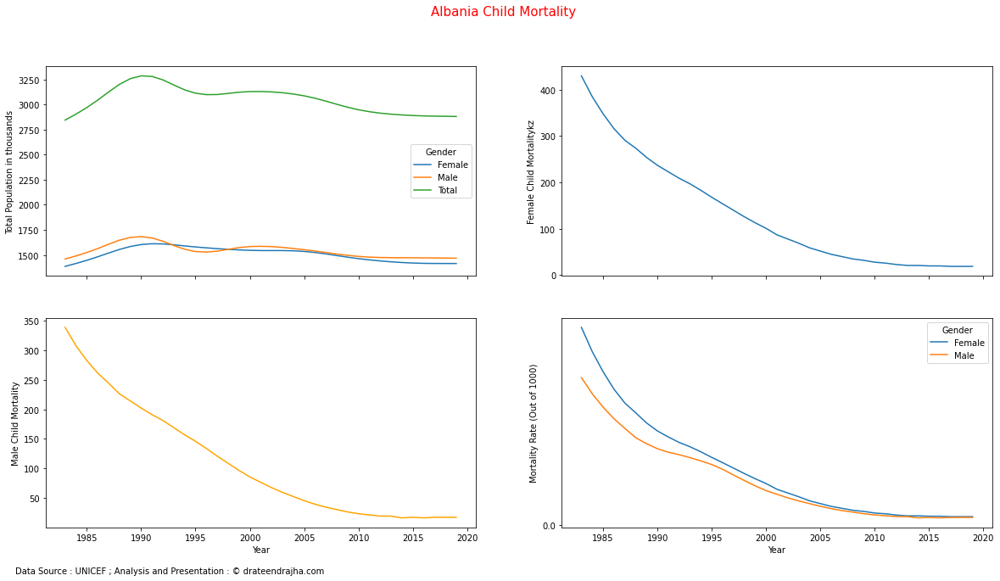

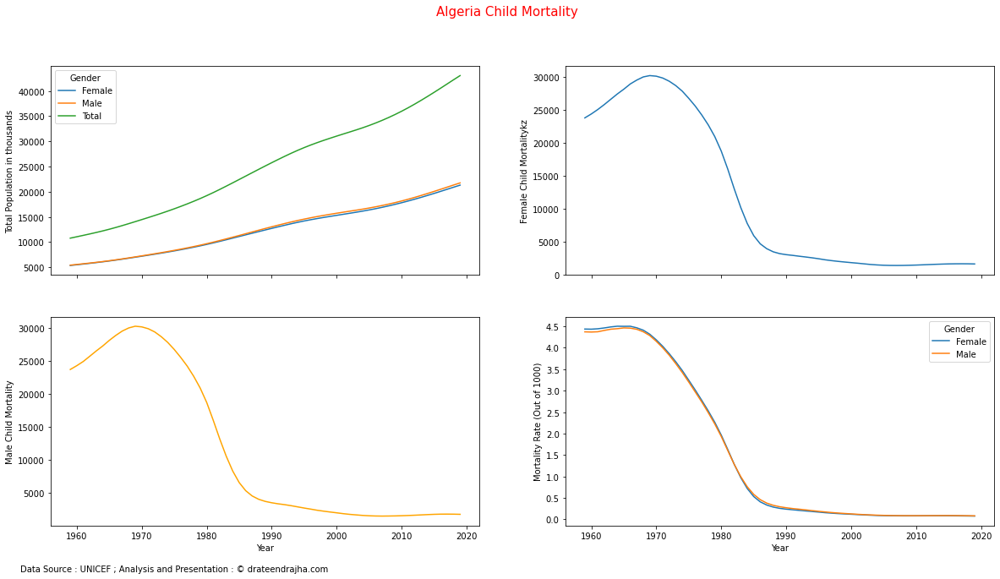

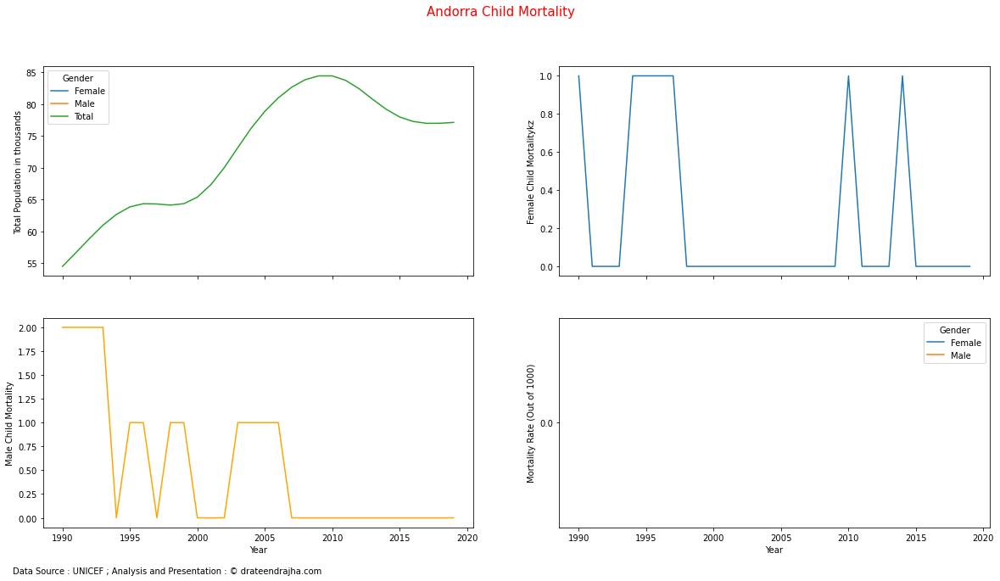

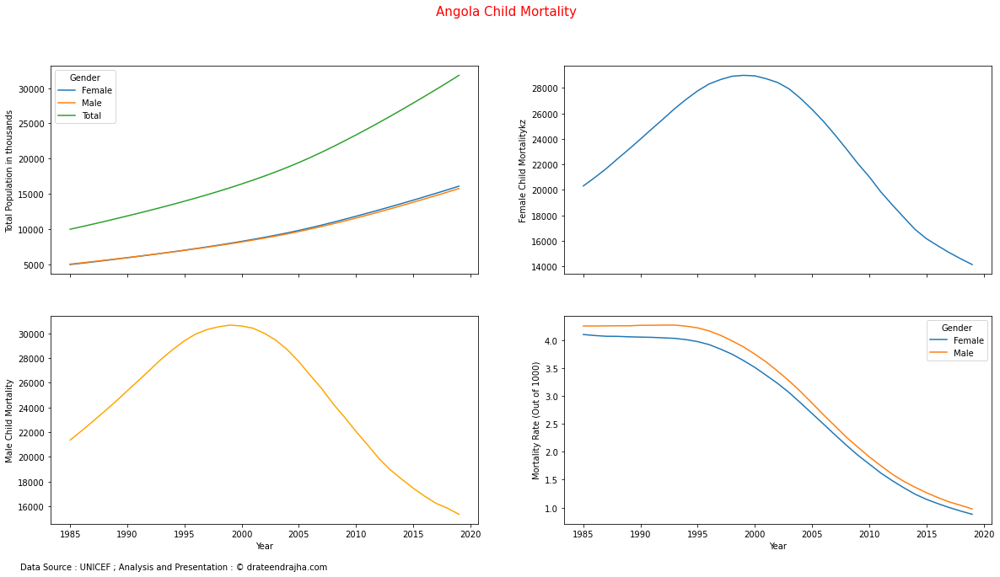

...

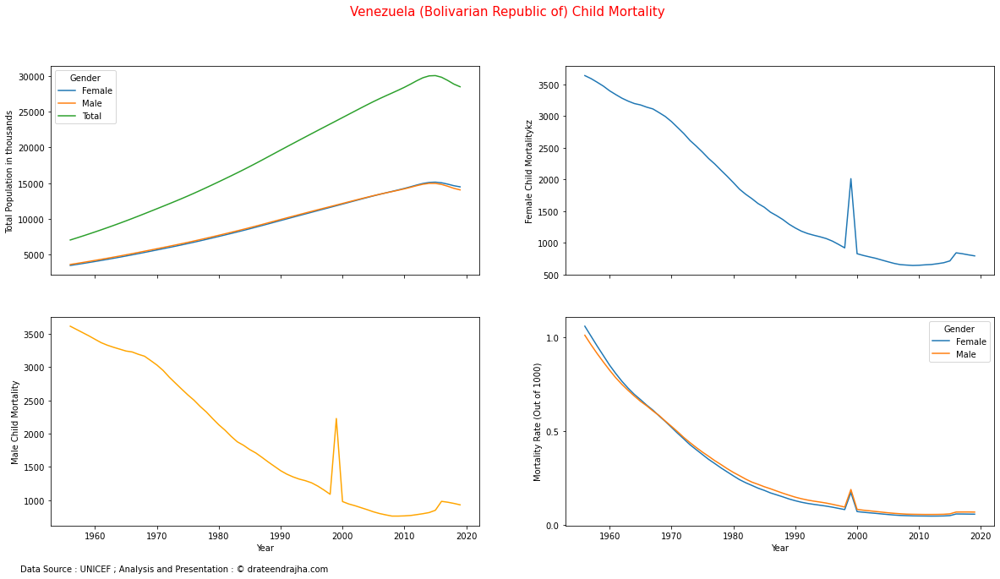

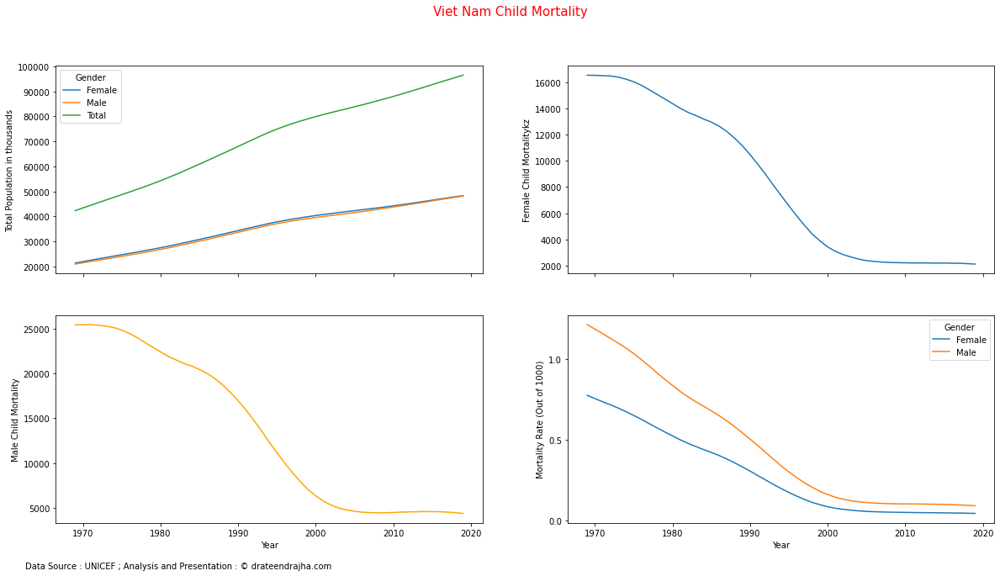

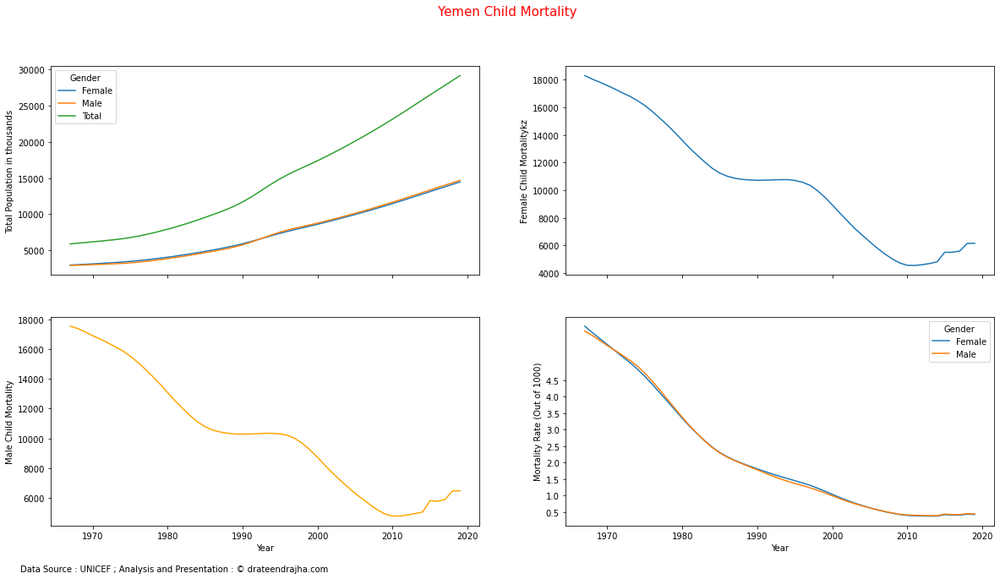

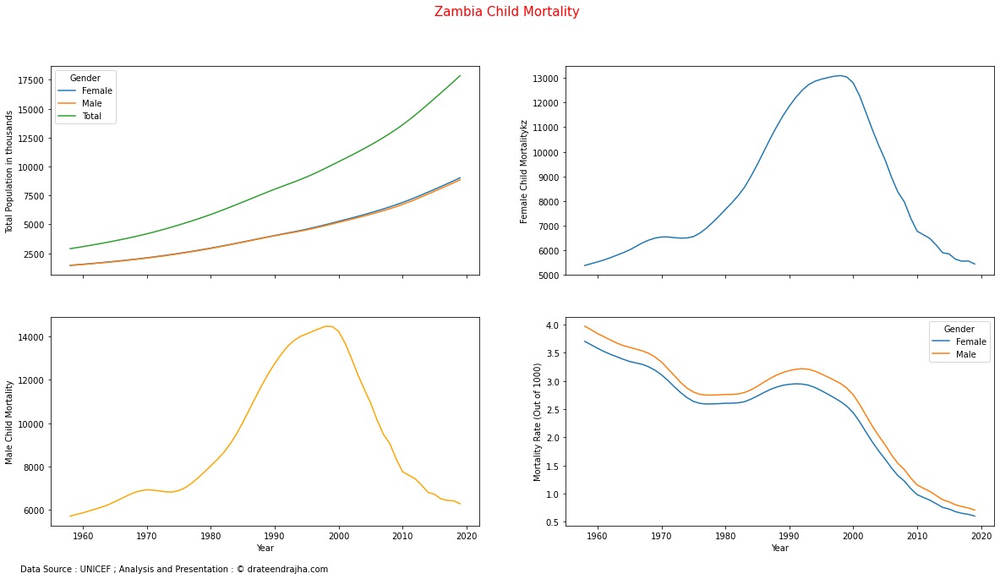

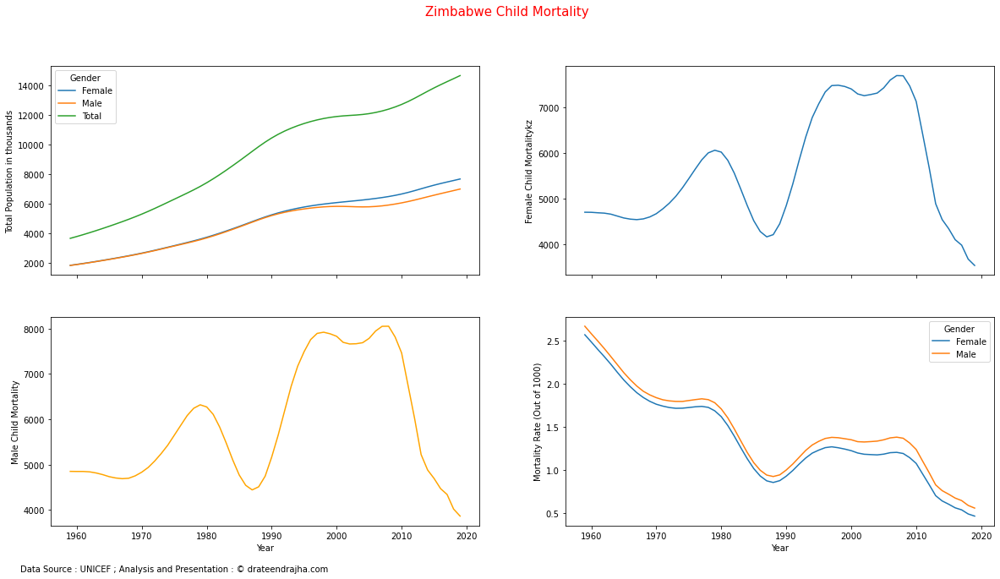

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
GlobalData =  pd.read_csv(r"C:\Users\ateen\Google Drive\Dataset\GLOBAL_DATAFLOW_UNICEF_1.0_all.csv")
# Correct the column name to make it readable 
ListofColumn = GlobalData.columns.to_list()
ListofColumn = [x.split(":")[0] for x in ListofColumn]
GlobalData.columns = ListofColumn
# Check the list of indicators present in this data set 
listINd = set(GlobalData.INDICATOR.to_list())
# Clean the items of indicator in readable form 
GlobalData['INDICATOR'] = [x.split(":")[-1].strip() for x in GlobalData.INDICATOR]
GlobalData['SEX'] = [x.split(":")[-1].strip() for x in GlobalData.SEX]
# Lets have analysis of mortality rate (2000-2018)
# Beffor going to this first lets have cleaning of few other parts also 
# Lets clean country column
GlobalData['REF_AREA'] = [x.split(":")[-1].strip() for x in GlobalData.REF_AREA ]
GlobalData.drop( labels = "DATAFLOW" ,  axis = 1, inplace= True ) 
Childdeaths1_4 = GlobalData[(GlobalData.INDICATOR == 'Child deaths (aged 1-4 years)')]
Childdeaths1_4 = Childdeaths1_4[['REF_AREA','INDICATOR', 'SEX', 'TIME_PERIOD', 'OBS_VALUE', 'UNIT_MULTIPLIER' , 'UNIT_MEASURE']]
TotalPop =  GlobalData[GlobalData.INDICATOR == 'Total population' ]
TotalPop = TotalPop[['REF_AREA','INDICATOR', 'SEX', 'TIME_PERIOD', 'OBS_VALUE', 'UNIT_MULTIPLIER' , 'UNIT_MEASURE']]
ChildMortalityRate = pd.merge(left=Childdeaths1_4, right=TotalPop, on=[ 'REF_AREA', 'TIME_PERIOD', 'SEX'], how='inner' )
ChildMortalityRate =  ChildMortalityRate[['REF_AREA','TIME_PERIOD', 'SEX', 'OBS_VALUE_x', 'OBS_VALUE_y']]
ChildMortalityRate.columns = ['Country','Year', 'Gender', 'Child Mortality(1 to 4)', 'Total Population']
ChildMortalityRate['Child Mortality(1 to 4)'], ChildMortalityRate['Total Population'], ChildMortalityRate['Year']= ChildMortalityRate['Child Mortality(1 to 4)'].astype('float'), ChildMortalityRate['Total Population'].astype('float'), ChildMortalityRate['Year'].astype('int')
ChildMortalityRate['Mortality Rate'] = [(x/(y*1000))*1000 for x,y in zip( ChildMortalityRate['Child Mortality(1 to 4)'], ChildMortalityRate['Total Population'])]
def plotchildmortality(country):
    fig, axs = plt.subplots(2,2, sharex=True, figsize=[20,10] )
    a = country+" Child Mortality"
    fig.suptitle(a, fontsize=15, color='red')
    axs[0,0].set_ylabel('Total Population in thousands')
    sns.lineplot(ax=axs[0,0], data=ChildMortalityRate[ChildMortalityRate.Country == country], x='Year' , y='Total Population', hue='Gender' )
    axs[0,1].set_ylabel('Female Child Mortalitykz')
    sns.lineplot(ax=axs[0,1], data=ChildMortalityRate[(ChildMortalityRate.Country == country) & (ChildMortalityRate.Gender=='Female')], x='Year', y='Child Mortality(1 to 4)')
    axs[1,0].set_ylabel('Male Child Mortality')
    sns.lineplot(ax=axs[1,0], data=ChildMortalityRate[(ChildMortalityRate.Country == country) & (ChildMortalityRate.Gender=='Male')], x='Year', y='Child Mortality(1 to 4)',  color='orange')
    axs[1,1].set_ylabel('Mortality Rate (Out of 1000)')
    axs[1,1].set_yticks(np.arange(0.0,5.0,0.5))
    sns.lineplot(ax=axs[1,1], data=ChildMortalityRate[(ChildMortalityRate.Country == country) & (ChildMortalityRate.Gender !='Total')], x='Year', y='Mortality Rate', hue='Gender')
    fig.text(.1,.05,'Data Source : UNICEF ; Analysis and Presentation : © drateendrajha.com')
    fig.show()
countrylist = list(ChildMortalityRate.Country.unique())
for c in countrylist:
    plotchildmortality(c)

--------------------------------------------------
#### For country-wise brief report please have a look in project section. 

* Brief Report  [https://github.com/users/ateendrajha/projects/4]
* Readme File [https://github.com/ateendrajha/Global-Child-Mortality/blob/main/README.md]
* © Copyright [https://www.drateendrajha.com]